# Introducción a la Ciencia de Redes con Python

En este notebook exploraremos algunos conceptos básicos de la ciencia de redes y
su implementación con `Python`. De manera particular, utilizaremos la librería
[`NetworkX`](https://networkx.org/) para la implementación y manejo de datos
asociados a redes.

Los temas que revisaremos en este notebook son:
- Definición y elementos de una red.
    - Nodos y enlaces.
    - Matriz de adyacencia.
- Introducción a `NetworkX`
- Medidas de centralidad.
    - Centralidad de grado.
    - Centralidad de eigenvectores.
    - Centralidad de intermediación.
    - Centralidad PageRank.*
    - Centralidad de cercanía.*
- Detección de comunidades basada en Modularidad.
    - Girvan - Newman


## Definición y elementos de una red

Podemos entender a una **red** o **grafo**, como una **forma de representación
de las relaciones o interacciones entre un conjunto de elementos**.

Por lo tanto los elementos esenciales de una red son:

1. **Nodos**: Conjunto de elementos.
2. **Enlaces** : Conjunto de relaciones o interacciones entre los elementos.

<div>
<img src="imagen_red.png" width="400"/>
</div>

Podemos representar matemáticamente a una red como:
$$ G = (N, E) $$

dónde *N* representa **al conjunto de nodos** de la red y *E* representa **al conjunto de
enlaces**. Así mismo, definimos a la *norma o tamaño de la red* como **el número de nodos**.

<div>
<img src="def_red.png" width="450"/>
</div>

Ahora implementemos una red sencilla en `NetworkX`

## Implementación básica de una red en `NetworkX`

Comenzamos por instalar e importar la librería.

In [1]:
# pip! install networkx
# pip! install pandas
# pip! install scipy

In [27]:
import os
from pathlib import Path

import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt

import numpy as np
from scipy.stats import linregress

Ahora definimos una red vacía:

In [3]:
G = nx.Graph()

Podemos agregar nodos, uno por uno, o varios al mismo tiempo con una lista:


In [4]:
G.add_node(1)

G.add_nodes_from([2,3,4])

También podemos agregar nodos con atributos, mediante tuplas asociadas cada nodo, con un diccionario con los atributos deseados:

In [5]:
G.add_nodes_from([(5, {"label": "John"}), (6, {"label": "Alice"})])

In [6]:
nx.get_node_attributes(G, "label")

{5: 'John', 6: 'Alice'}

Como hemos mencionado antes, una red se compone de **nodos** y **enlaces**.

Podemos insepccionar los nodos en `G` con el atributo `nodes`:

In [7]:
G.nodes

NodeView((1, 2, 3, 4, 5, 6))

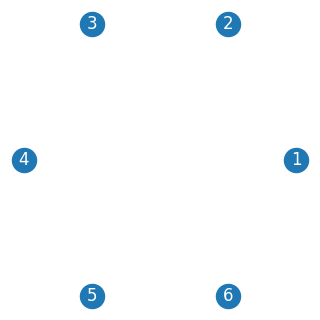

In [8]:
etiquetas_nodos = nx.get_node_attributes(G, 'label')
# print(labels)

f_size = 3
plt.figure(figsize=(f_size,f_size))
nx.draw_circular(G, with_labels=True, font_weight='regular', font_color="white")

Hasta el momento, solamente hemos agregado nodos a nuestra red, pero no tenemos enlaces entre ellos aún.

Esto lo podemos verificar inspeccionando el atributo `edges` de nuestra red `G`:

In [9]:
G.edges

EdgeView([])

Podemos examinar los atributos asociados a los nodos con:

In [10]:
set([k for n in G.nodes for k in G.nodes[n].keys()])

{'label'}

De la misma manera que con los nodos de la red, podemos agregar enlaces, uno a uno, varios desde una lista.

También es posible asignar *peso* a los enlaces especificándolo cuando agregamos
de uno por uno, o por medio de un diccionario en la tupla asociada al enlace,
cuando lo hacemos con una lista.

In [11]:
G.add_edge(0, 1)

G.add_edge(1, 3, weight=2.0)

G.add_edges_from([(1,3), (0,2), (4,3)])

G.add_edges_from([(0,3, {"weight": 3.0}), (0,5, {"weight": 6.0}), (4,6, {"weight": 10.0})])

In [12]:
G.edges

EdgeView([(1, 0), (1, 3), (2, 0), (3, 4), (3, 0), (4, 6), (5, 0)])

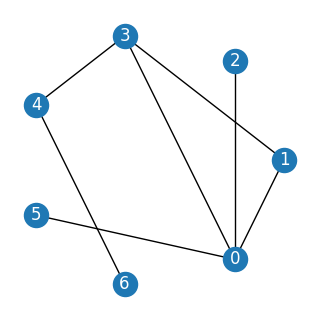

In [13]:
f_size = 3
plt.figure(figsize=(f_size,f_size))
nx.draw_circular(G, with_labels=True, font_color='white')

### Matriz de adyacencia

No podemos solamente utilizar la visualización de la red para analizarlas. 

Las representaciones gráficas son útiles para tener una intuición del
sistema/red pero necesitamos herramientas para encapsular la información en la
red y poder analizarlas y realizar análisis matemáticos sobre ellos.

Una de éstas herramientas es la **matriz de adyacencia**, que nos permite representar
matemáticamente las relaciones o interacciones entre los nodos.

La **matriz de adyacencia**, usualmente denotada por *A* es un arreglo bidimensional de dimensión *NxN* donde *N* es el número de nodos en la red.

Cada entrada representa la presencia o ausencia de interacción entre cada par de nodos.

En una red sin pesos:

$A_{ij} = 1$ 

si hay una interacción entre el nodo *i* y el nodo *j*, y 

$A_{ij} = 0$

en el caso en el que **no** hay una interacción entre el mismo par de nodos.

<div>
<img src="mat_adj.png" width="500"/>
</div>

Ahora, si la red es **no dirigida** se cumple que:

$A_{ij} = A_{ji}$

es decir, la matriz *A* es simétrica.

Por otro lado, en el caso en el que la red **sea dirigida**, en general:

$A_{ij} \neq A_{ji}$

es decir, la matriz, y las interacciones entre los nodos, **no son necesariamente simétricas**.

Los enlaces en la red, además de representar la presencia o ausencia de una
relación o interacción entre un par de nodos, también pueden representar **la
intensidad de la interacción entre ellos**, asignando un **peso** al enlace.
Matemáticamente, ésto lo representamos como:

$A_{ij} = \omega_{ij}$

donde 

$\omega_{ij} \in \mathbb{R}$,

es decir, el peso puede ser un número real arbitrario que representa cuantitativamente la intensidad de la interacción entre los nodos.


Examinemos la matriz de adyacencia de la red que definimos antes:

[[ 0.  0.  2.  0.  0.  0.  1.]
 [ 0.  0.  0.  0.  0.  0.  1.]
 [ 2.  0.  0.  1.  0.  0.  3.]
 [ 0.  0.  1.  0.  0. 10.  0.]
 [ 0.  0.  0.  0.  0.  0.  6.]
 [ 0.  0.  0. 10.  0.  0.  0.]
 [ 1.  1.  3.  0.  6.  0.  0.]]


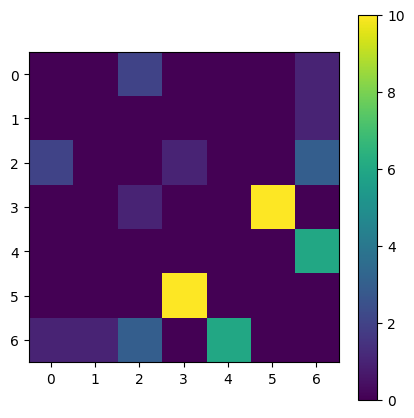

In [14]:
matriz_adyacencia = nx.to_numpy_array(G, weight="weight")

print(matriz_adyacencia)

f_size = 5
plt.figure(figsize=(f_size,f_size))
plt.imshow(matriz_adyacencia, cmap='viridis', interpolation='nearest')
plt.colorbar()
plt.show()

Ya que hemos revisado el procedimiento **básico** para crear redes y agregar **nodos y enlaces**, procederemos a cargar un conjunto de datos para analizarlos.

## La red de personajes de Game of Thrones

Para practicar el análisis de redes, y como construirlas a partir de un corpus de texto, utilizaremos nodos y enlaces obtenidos de los textos de **Game of Thrones**.

En particular en nuestro caso:
- Los nodos corresponden a los personajes que aparecen en las novelas.
- Los enlaces corresponden a apariciones de los personajes en ventanas de 15 palabras en el texto.

Los datos se pueden descargar desde este [repositorio de datos](https://github.com/mathbeveridge/asoiaf)

Comenzamos por definir un par de variables que apuntan al folder donde se
encuentran los datos, e imprimir el contenido del folder.

In [15]:
data_path = os.path.join("asoiaf-master", "data")

os.listdir(data_path)

['asoiaf-book4-nodes.csv',
 'asoiaf-all-nodes.csv',
 'asoiaf-book1-nodes.csv',
 'asoiaf-book45-nodes.csv',
 'asoiaf-book2-nodes.csv',
 'asoiaf-book4-edges.csv',
 'asoiaf-all-edges.csv',
 'asoiaf-book5-edges.csv',
 'asoiaf-book2-edges.csv',
 'asoiaf-book5-nodes.csv',
 'asoiaf-book1-edges.csv',
 'asoiaf-book3-nodes.csv',
 'asoiaf-book45-edges.csv',
 'asoiaf-book3-edges.csv']

Observamos una lista de archivos, uno para cada libro y uno que corresponde al
agregado de todos los libros.

Los pares de archivos de cada libro corresponden a las **listas de nodos y
enlaces** que nos permitirán construir las redes entre personajes.

Los archivos se tienen la extensión `CSV`, que significa *comma separated value*
y representa el formato de nuestros datos.

El formato `CSV` nos permite representar **tablas de datos**, en el que cada
renglón es una observación o registro (renglones en una tabla), y cada uno de
sus atributos o características se separan por comas (columnas en una tabla),
por ejemplo:

```
nombre,apellido,edad
Juan,Perez,30
```

Para, cargar los datos en lo archivos `CSV` utilizaremos la librería `pandas`
que nos permite cargar, manipular y analizar datos tabulares.

Por simplicidad, trabajaremos solamente con los archivos asociados a un libro,
pero la dinámica es la misma para el resto de los datos.

Para cargar los datos almacenados en los archivos `CSV`, utilizamos una función
de la librería `pandas` con la siguiente sintaxis:

`pd.read_csv(ruta_al_archivo_de_datos)`

In [16]:
archivo_nodos = 'asoiaf-book1-nodes.csv'
nodos_df = pd.read_csv(os.path.join(data_path, archivo_nodos))
nodos_df

,Id,Label
0,Addam-Marbrand,Addam Marbrand
1,Aegon-I-Targaryen,Aegon I Targaryen
2,Aemon-Targaryen-(Maester-Aemon),Aemon Targaryen (Maester Aemon)
3,Aerys-II-Targaryen,Aerys II Targaryen
4,Aggo,Aggo
...,...,...
182,Will-(prologue),Will (prologue)
183,Willis-Wode,Willis Wode
184,Wyl-(guard),Wyl (guard)
185,Wylla,Wylla


In [17]:
archivo_enlaces = 'asoiaf-book1-edges.csv'
enlaces_df = pd.read_csv(os.path.join(data_path, archivo_enlaces))
enlaces_df

,Source,Target,Type,weight,book
0,Addam-Marbrand,Jaime-Lannister,Undirected,3,1
1,Addam-Marbrand,Tywin-Lannister,Undirected,6,1
2,Aegon-I-Targaryen,Daenerys-Targaryen,Undirected,5,1
3,Aegon-I-Targaryen,Eddard-Stark,Undirected,4,1
4,Aemon-Targaryen-(Maester-Aemon),Alliser-Thorne,Undirected,4,1
...,...,...,...,...,...
679,Tyrion-Lannister,Willis-Wode,Undirected,4,1
680,Tyrion-Lannister,Yoren,Undirected,10,1
681,Tywin-Lannister,Varys,Undirected,4,1
682,Tywin-Lannister,Walder-Frey,Undirected,8,1


En la tabla original, tenemos todas las interacciones estre enlaces por
separado, ahora sumamos todas las interacciones que aparecen a lo largo de todo
el libro para resumir las interacciones entre personajes.

In [18]:
enlaces_agregados_df = enlaces_df.groupby(['Source','Target']).agg({'weight':'sum'}).reset_index()
enlaces_agregados_df.sort_values(by='weight', ascending=False, inplace=True)

enlaces_agregados_df

,Source,Target,weight
329,Eddard-Stark,Robert-Baratheon,291
134,Bran-Stark,Robb-Stark,112
62,Arya-Stark,Sansa-Stark,104
249,Daenerys-Targaryen,Drogo,101
479,Joffrey-Baratheon,Sansa-Stark,87
...,...,...,...
23,Albett,Halder,3
25,Albett,Rast,3
26,Alliser-Thorne,Bowen-Marsh,3
27,Alliser-Thorne,Grenn,3


Ahora, pasamos a construir la red de personajes partiendo de la lista de enlaces

In [19]:
red_personajes = nx.Graph()

for r in enlaces_agregados_df.itertuples(index=False):
    red_personajes.add_edge(r.Source, r.Target, weight=r.weight)

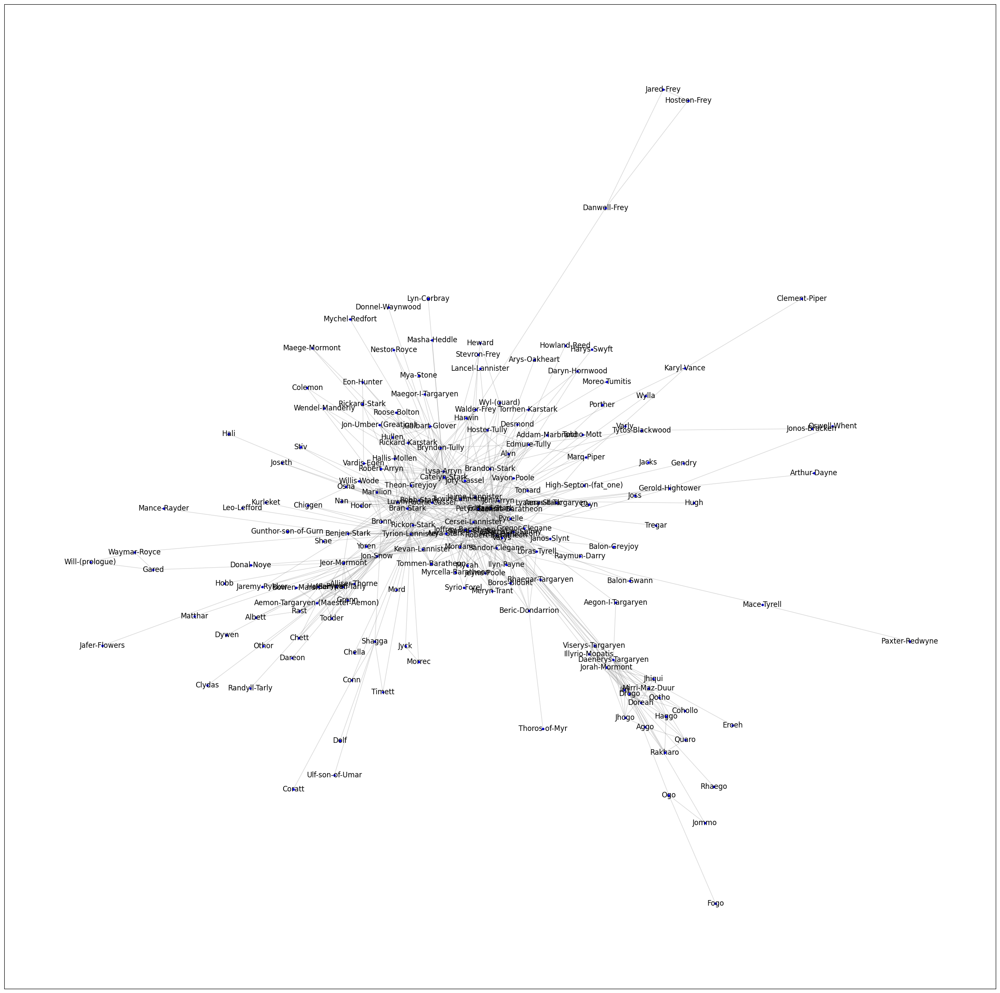

In [20]:
f_size = 30
plt.figure(figsize=(f_size,f_size))

all_pos = nx.spring_layout(red_personajes)
# all_pos = nx.circular_layout(red_personajes)

# Draw nodes
nx.draw_networkx_nodes(red_personajes, pos=all_pos, node_color='blue', node_size=10, alpha=1)
# Draw edges
nx.draw_networkx_edges(red_personajes, pos=all_pos, edge_color='gray', alpha=0.3)
# Draw labels
nx.draw_networkx_labels(red_personajes, pos=all_pos)

plt.show()

[[  0. 291.  19. ...   0.   3.   3.]
 [291.   0.  11. ...   0.   0.   0.]
 [ 19.  11.   0. ...   0.   0.   0.]
 ...
 [  0.   0.   0. ...   0.   0.   0.]
 [  3.   0.   0. ...   0.   0.   0.]
 [  3.   0.   0. ...   0.   0.   0.]]


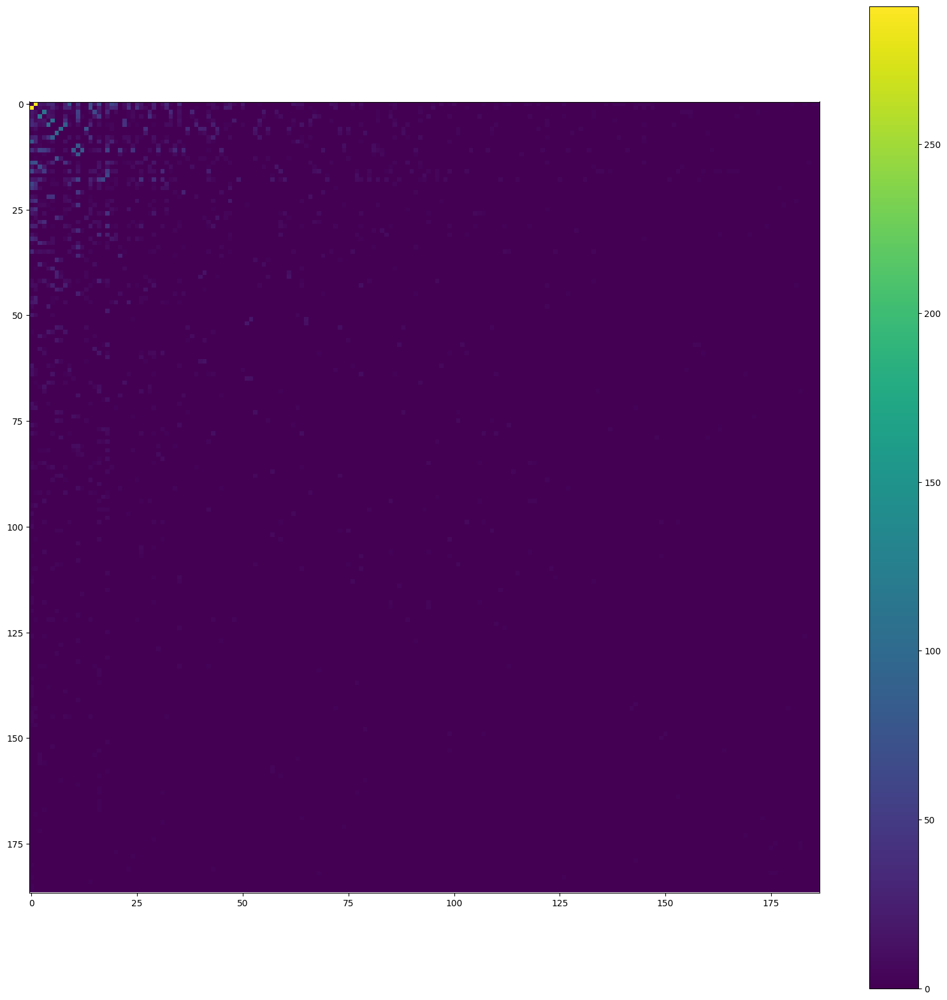

In [23]:
# matriz_adyacencia = nx.adjacency_matrix(red_personajes)
matriz_adyacencia = nx.to_numpy_array(red_personajes, weight="weight")

print(matriz_adyacencia)

a = matriz_adyacencia

color_map = 'viridis'

f_size = 20
plt.figure(figsize=(f_size,f_size))
plt.imshow(a, cmap=color_map, interpolation='nearest')
plt.colorbar()
plt.show()

Ya que hemos construído nuestra red, vamos a analizarla.

Comenzamos con caracterizar a los nodos en la red, por medio de algunas **medidas de centralidad**.

Las **medidas de centralidad** son **valores escalares** (es decir números) que asignamos a cada nodo en la red
para **cuantificar su importancia basados en ciertas suposiciones**.



### Distribución de grado

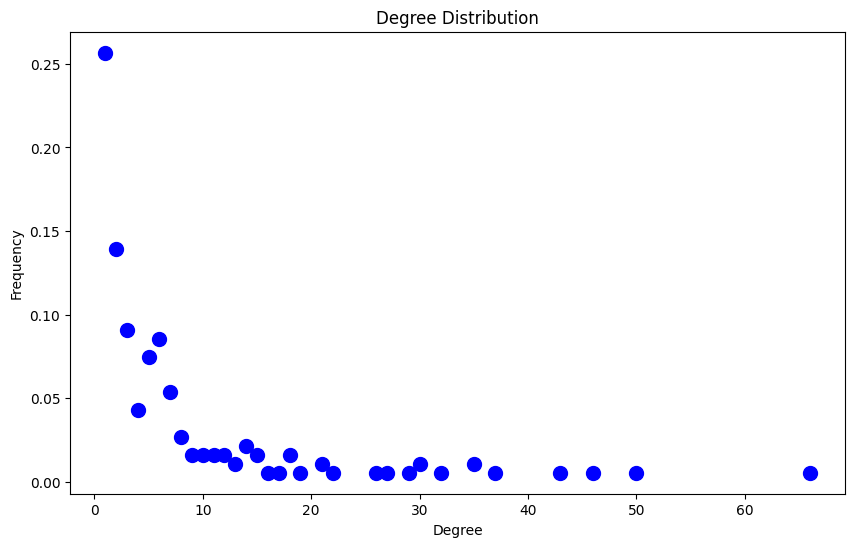

In [31]:
# Compute the degree of each node
degree_sequence = [d for n, d in red_personajes.degree()]

# Compute the degree distribution
degree_count = {deg: degree_sequence.count(deg) for deg in set(degree_sequence)}

# Normalize the degree distribution
total_nodes = len(red_personajes.nodes())
degree_count = {deg: count / total_nodes for deg, count in degree_count.items()}


# Sort the degrees for plotting
deg, cnt = zip(*sorted(degree_count.items()))

# Plot the degree distribution
plt.figure(figsize=(10, 6))
# plt.scatter(deg, cnt, width=0.80, color='b')
plt.scatter(deg, cnt, color='b', s=100)

plt.title("Degree Distribution")
plt.xlabel("Degree")
plt.ylabel("Frequency")
plt.show()


Slope: -1.0676053850221774


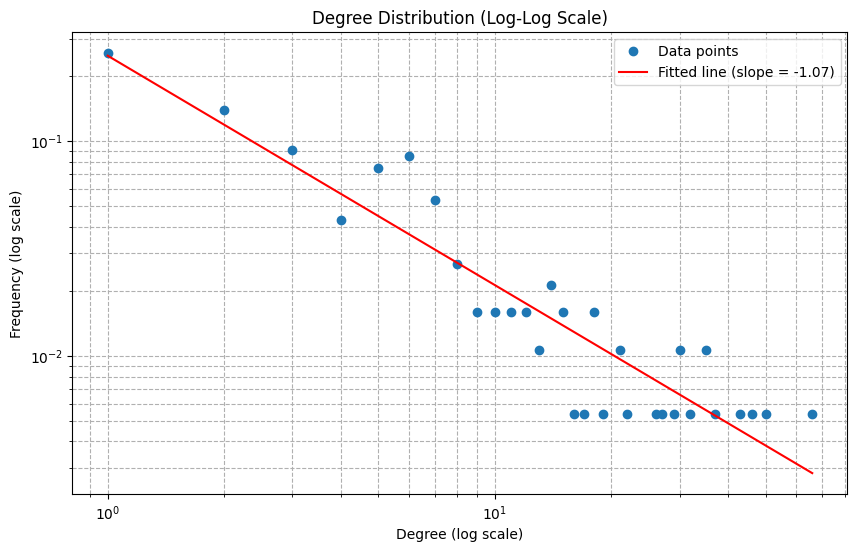

In [32]:
# Convert to numpy arrays for convenience
deg = np.array(deg)
cnt = np.array(cnt)

# Apply log transformation (avoid log(0) by filtering out zero entries)
log_deg = np.log10(deg[deg > 0])
log_cnt = np.log10(cnt[deg > 0])

# Perform linear regression on the log-transformed data
slope, intercept, r_value, p_value, std_err = linregress(log_deg, log_cnt)

# Print the slope
print(f"Slope: {slope}")

# Plot the degree distribution on a log-log scale
plt.figure(figsize=(10, 6))
plt.loglog(deg, cnt, 'o', label='Data points')

# Plot the fitted line
plt.loglog(deg, 10**intercept * deg**slope, 'r-', label=f'Fitted line (slope = {slope:.2f})')

plt.title("Degree Distribution (Log-Log Scale)")
plt.xlabel("Degree (log scale)")
plt.ylabel("Frequency (log scale)")
plt.legend()
plt.grid(True, which="both", ls="--")
plt.show()

### Centralidad de grado

Es la medida de centralidad más sencilla, y corresponde **al número de vecinos
de cada nodo en la red**. Por lo tanto entre más vecinos tiene un nodo en la red
está *mejor* conectado el nodo en la red y asumimos **que tiene una mayor
influencia**.

<div>
<img src="cent_deg.png" width="500"/>
</div>

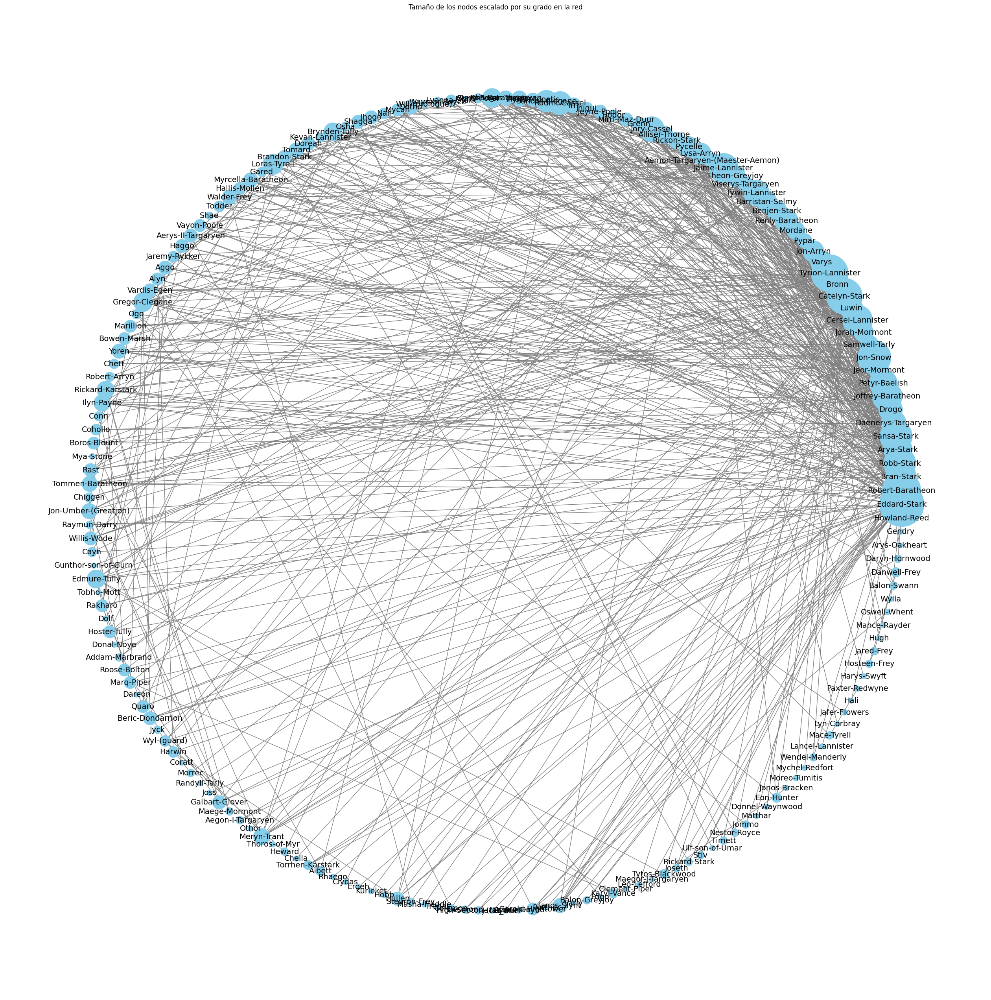

In [40]:
plt.figure(figsize=(25, 25))
node_sizes = [d * 100 for n, d in red_personajes.degree()]  # Scale factor for better visualization

# pos = nx.spring_layout(red_personajes)
pos = nx.circular_layout(red_personajes)

nx.draw(red_personajes, pos, with_labels=True, node_size=node_sizes, node_color="skyblue", edge_color="gray", font_size=14)

plt.title("Tamaño de los nodos escalado por su grado en la red")
plt.show()

**La centralidad de grado es una medida local**. Aunque nos da una idea de la conectividad de cada nodo en la red, no nos proporciona una imagen global de la red.


### Eigencentralidad o centralidad de Eigenvectores

Esta centralidad mide la importancia de cada nodo en la red tomando en consideración las propiedades de sus vecinos.

En diferentes circunstancias **la importancia de un nodo se incrementa por
conectarse con otros nodos que son a su vez *importantes***, la medida de
centralidad de eigenvectores hace esta consideración. 

<div>
<img src="eigen_cent.png" width="1000"/>
</div>

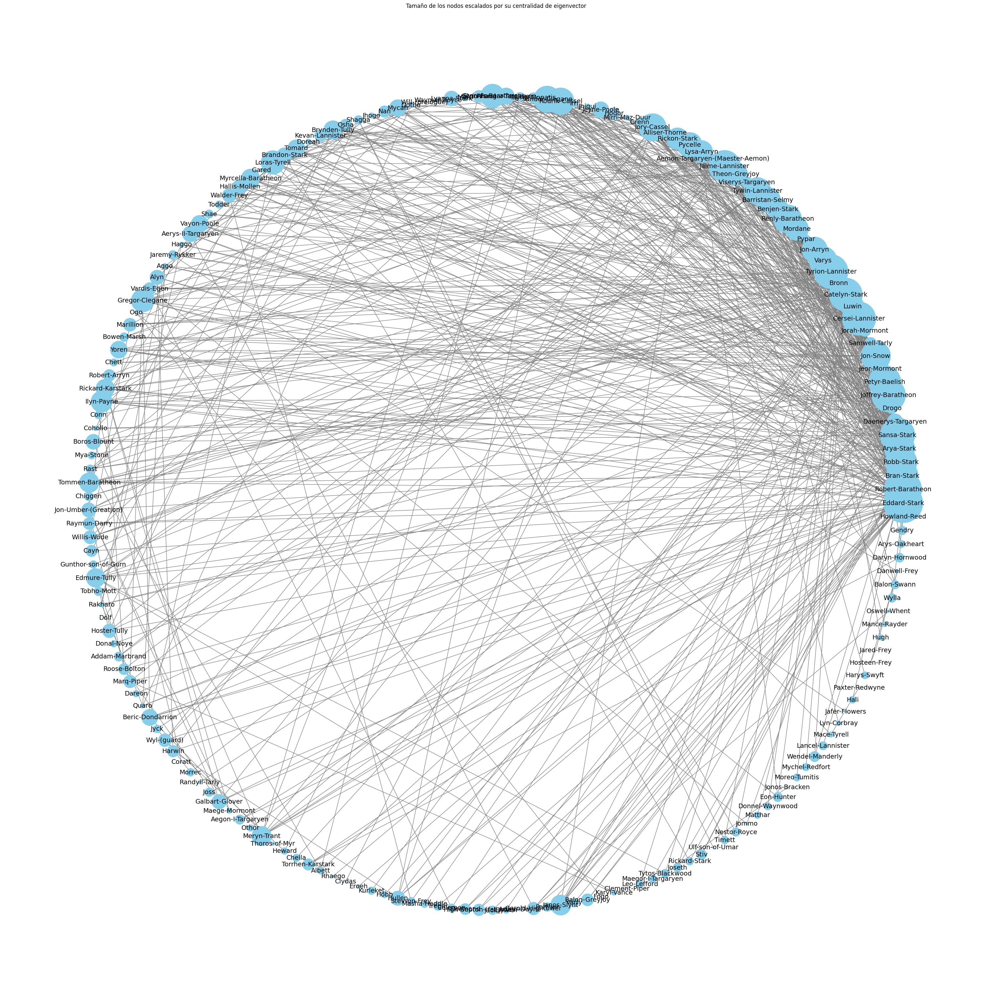

In [47]:
# Compute the eigenvector centrality of nodes
eigenvector_centrality = nx.eigenvector_centrality(red_personajes)

# Get the centrality values and scale them for visualization
centrality_values = np.array(list(eigenvector_centrality.values()))
node_sizes = 25000 * centrality_values  # Scale for better visualization

# Plot the graph with node sizes scaled by eigenvector centrality
plt.figure(figsize=(30, 30))

# pos = nx.spring_layout(red_personajes)
pos = nx.circular_layout(red_personajes)

nx.draw(red_personajes, pos, with_labels=True, node_size=node_sizes, node_color="skyblue", edge_color="gray", font_size=14)

plt.title("Tamaño de los nodos escalados por su centralidad de eigenvector")
plt.show()

Esta centralidad **tiene un sesgo asociado a los hubs de la red**

<div>
<img src="eigen_bias.png" width="600"/>
</div>

### Medida de centralidad de intermediación (betweeness)

Cuantifica en que medida cada nodo se encuentra entre los caminos que conectan al resto de los nodos.

Podemos considerar que los nodos con un valor alto de esta medida de centralidad son importantes por poder "controlar" el flujo de información dentro de la red.

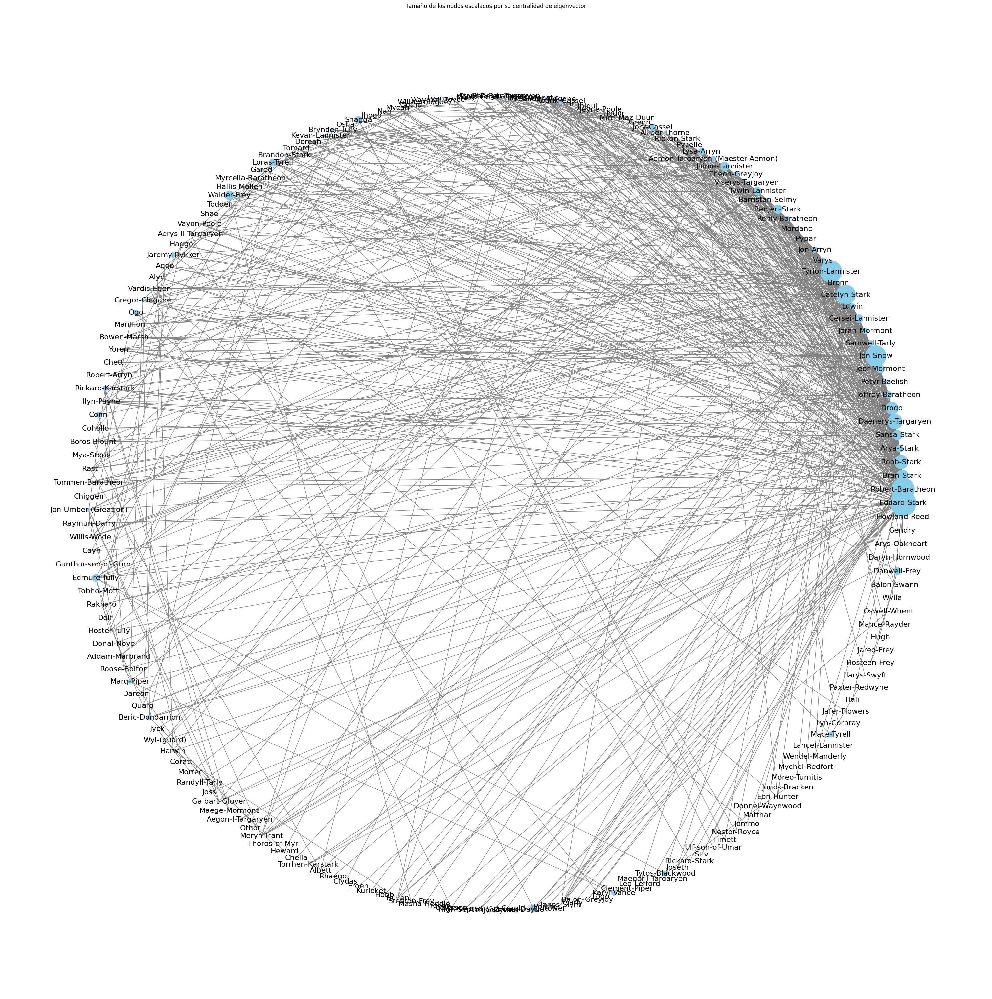

In [54]:
# Compute the eigenvector centrality of nodes
closeness_centrality = nx.betweenness_centrality(red_personajes)

# Get the centrality values and scale them for visualization
centrality_values = np.array(list(closeness_centrality.values()))
node_sizes = 12000 * centrality_values  # Scale for better visualization

# Plot the graph with node sizes scaled by eigenvector centrality
plt.figure(figsize=(30, 30))

# pos = nx.spring_layout(red_personajes)
pos = nx.circular_layout(red_personajes)

nx.draw(red_personajes, pos, with_labels=True, node_size=node_sizes, node_color="skyblue", edge_color="gray", font_size=16)

plt.title("Tamaño de los nodos escalados por su centralidad de intermediación")
plt.show()